In [47]:
import pandas as pd

#load the dataset into dataframe
df = pd.read_csv("train.csv")


df_cleaned = df.dropna(axis=1)
df_cleaned

,Id,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,2,2008,WD,Normal,208500
1,2,20,RL,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,...,0,0,0,0,0,5,2007,WD,Normal,181500
2,3,60,RL,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,9,2008,WD,Normal,223500
3,4,70,RL,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,...,272,0,0,0,0,2,2006,WD,Abnorml,140000
4,5,60,RL,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,...,0,0,0,0,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,7917,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,8,2007,WD,Normal,175000
1456,1457,20,RL,13175,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,2,2010,WD,Normal,210000
1457,1458,70,RL,9042,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,9717,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,112,0,0,0,0,4,2010,WD,Normal,142125


In [27]:
#Correlation matrix to see the correlations between all numeric columns
correlation_matrix = df_cleaned.select_dtypes(include=['number']).corr()
print(correlation_matrix)

                     Id  MSSubClass   LotArea  OverallQual  OverallCond  \
Id             1.000000    0.011156 -0.033226    -0.028365     0.012609   
MSSubClass     0.011156    1.000000 -0.139781     0.032628    -0.059316   
LotArea       -0.033226   -0.139781  1.000000     0.105806    -0.005636   
OverallQual   -0.028365    0.032628  0.105806     1.000000    -0.091932   
OverallCond    0.012609   -0.059316 -0.005636    -0.091932     1.000000   
YearBuilt     -0.012713    0.027850  0.014228     0.572323    -0.375983   
YearRemodAdd  -0.021998    0.040581  0.013788     0.550684     0.073741   
BsmtFinSF1    -0.005024   -0.069836  0.214103     0.239666    -0.046231   
BsmtFinSF2    -0.005968   -0.065649  0.111170    -0.059119     0.040229   
BsmtUnfSF     -0.007940   -0.140759 -0.002618     0.308159    -0.136841   
TotalBsmtSF   -0.015415   -0.238518  0.260833     0.537808    -0.171098   
1stFlrSF       0.010496   -0.251758  0.299475     0.476224    -0.144203   
2ndFlrSF       0.005590  

This correlation matrix provides insight into the relationships between various features in your dataset. Here's a summary of the most notable observations:

SalePrice and OverallQual (0.79): The highest correlation is between SalePrice and OverallQual. This indicates that as the overall quality of the property increases, the sale price tends to increase as well. This is a strong positive correlation.

SalePrice and TotalBsmtSF (0.61): There's also a significant positive correlation between SalePrice and TotalBsmtSF, which suggests that homes with larger basement areas tend to have higher sale prices.

SalePrice and GrLivArea (0.59): The size of the ground-level living area (GrLivArea) also has a strong positive relationship with SalePrice, which is expected—larger homes generally sell for more.

SalePrice and GarageCars (0.60): Similarly, the number of cars a garage can accommodate is positively correlated with the sale price, which makes sense since properties with larger garages are likely to have higher value.

SalePrice and 1stFlrSF (0.61): The size of the first floor is another factor closely related to the sale price, again highlighting the importance of overall house size.

Negative correlations with SalePrice:

OverallCond (-0.08): There's a very weak negative correlation between sale price and the overall condition of the house, which suggests that condition might not have as strong of an impact as other features like quality.
EnclosedPorch (-0.13): The size of enclosed porches seems to have a very weak negative relationship with sale price.
YearBuilt and YearRemodAdd: There's a moderate positive correlation between the year the house was built and the year of its most recent remodeling. This makes sense, as homes that are older may undergo remodeling to stay competitive in the market.

In [29]:
# Keep only numeric columns
numeric_df = df_cleaned.select_dtypes(include=[np.number])

# Calculate correlation matrix
correlation_matrix = numeric_df.corr()

# Set a threshold for "important" correlations
threshold = 0.5

# Filter correlations based on the threshold
important_correlations = correlation_matrix[(correlation_matrix.abs() > threshold) & (correlation_matrix != 1.0)]

# Remove NaN values for clean display
important_correlations = important_correlations.dropna(how='all', axis=0).dropna(how='all', axis=1)

# Display the important correlations
print("Important Correlations (|correlation| > 0.5):")
print(important_correlations)



Important Correlations (|correlation| > 0.5):
              OverallQual  YearBuilt  YearRemodAdd  BsmtFinSF1  TotalBsmtSF  \
OverallQual           NaN   0.572323      0.550684         NaN     0.537808   
YearBuilt        0.572323        NaN      0.592855         NaN          NaN   
YearRemodAdd     0.550684   0.592855           NaN         NaN          NaN   
BsmtFinSF1            NaN        NaN           NaN         NaN     0.522396   
TotalBsmtSF      0.537808        NaN           NaN    0.522396          NaN   
1stFlrSF              NaN        NaN           NaN         NaN     0.819530   
2ndFlrSF              NaN        NaN           NaN         NaN          NaN   
GrLivArea        0.593007        NaN           NaN         NaN          NaN   
BsmtFullBath          NaN        NaN           NaN    0.649212          NaN   
FullBath         0.550600        NaN           NaN         NaN          NaN   
HalfBath              NaN        NaN           NaN         NaN          NaN   
Bedroo

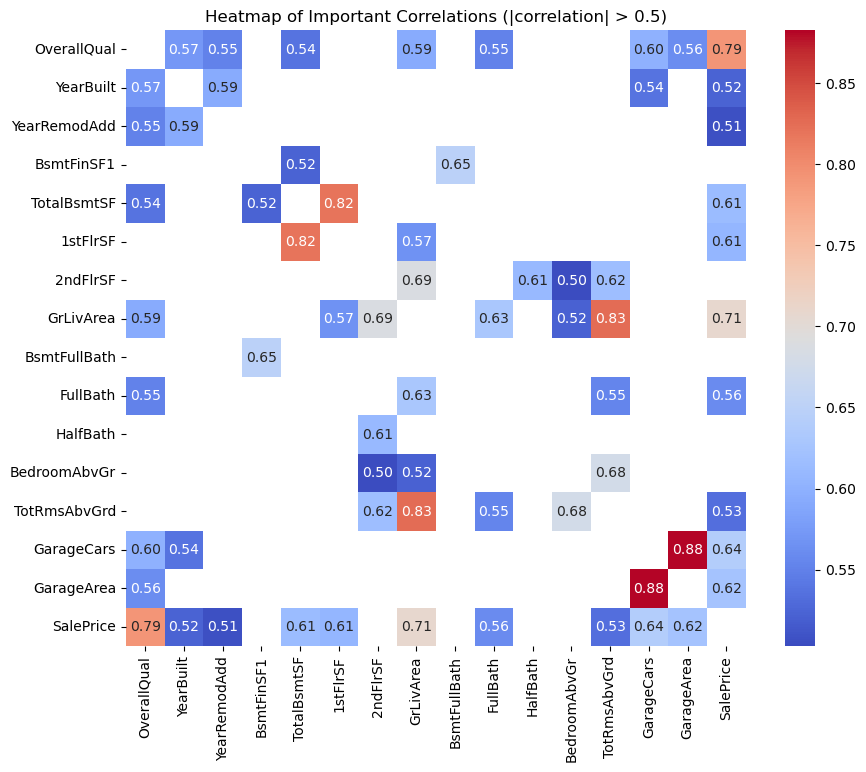

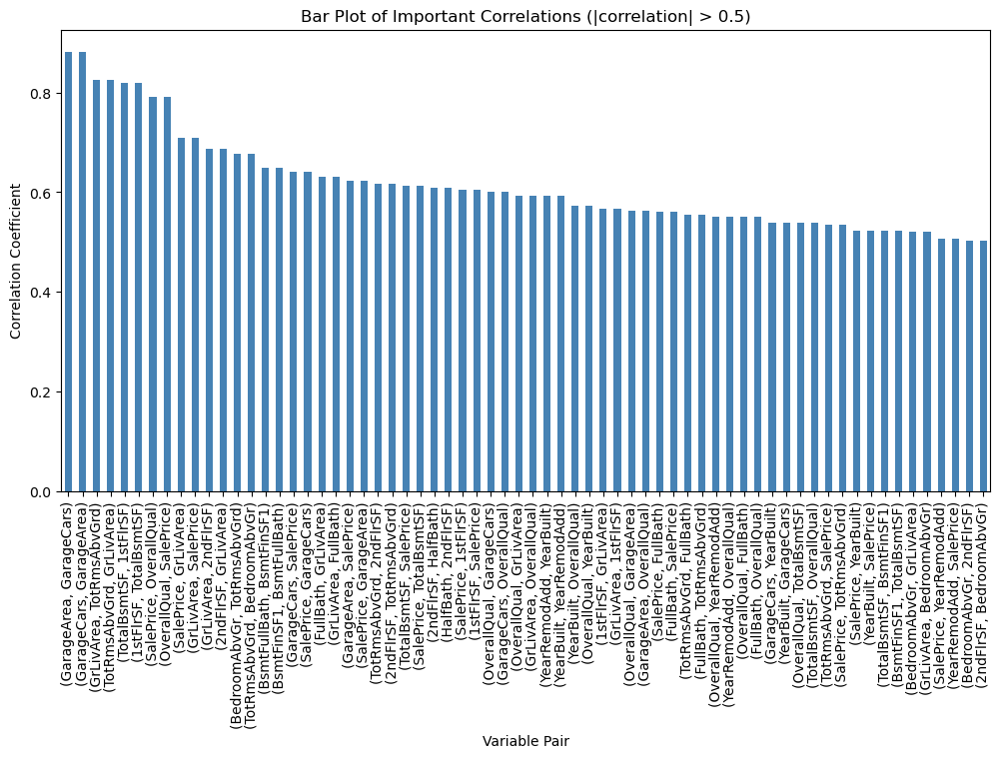

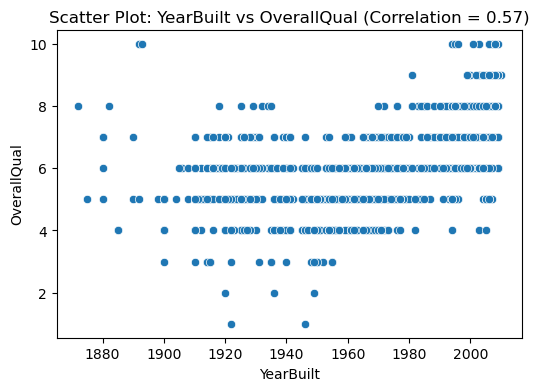

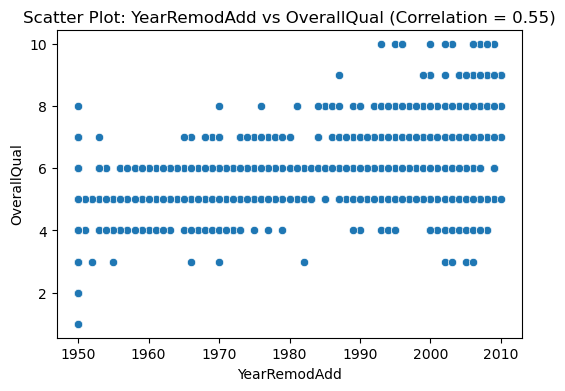

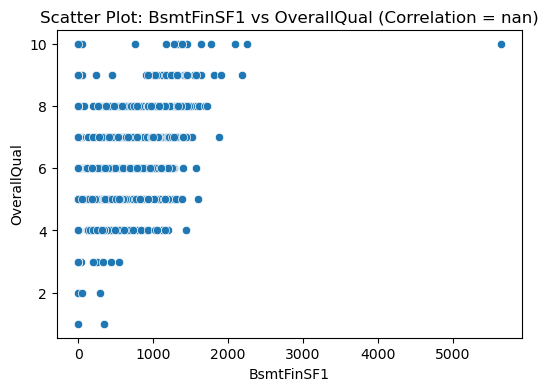

...

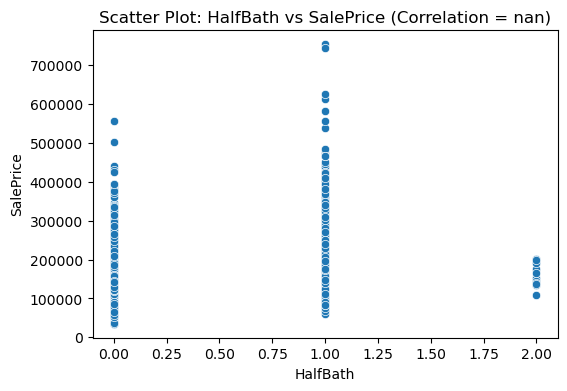

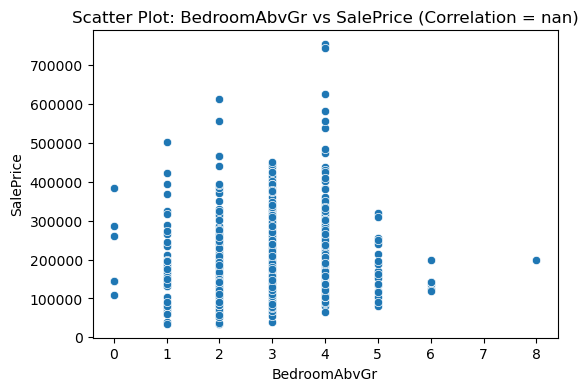

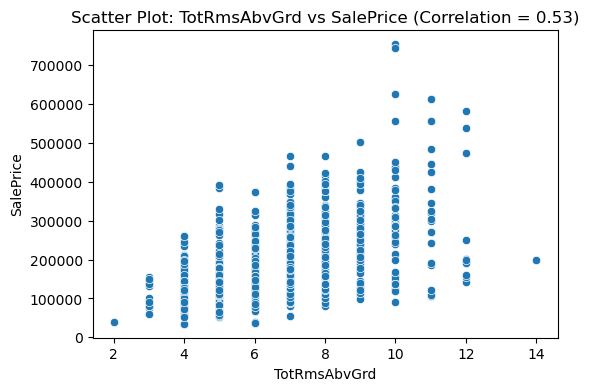

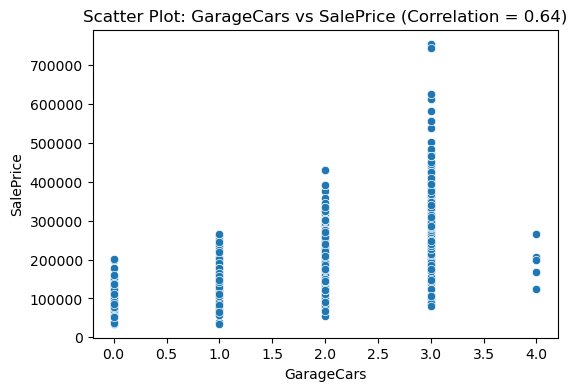

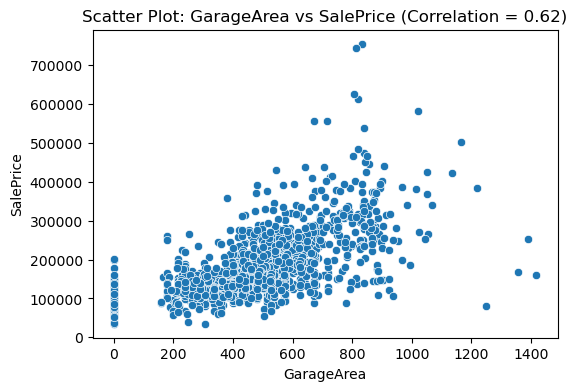

In [30]:
import seaborn as sns
import matplotlib.pyplot as plt

# Heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(important_correlations, annot=True, cmap='coolwarm', fmt='.2f', cbar=True)
plt.title("Heatmap of Important Correlations (|correlation| > 0.5)")
plt.show()

# Bar Plot
plt.figure(figsize=(12, 6))
important_correlations_stack = important_correlations.stack().sort_values(ascending=False)
important_correlations_stack.plot(kind='bar', color='steelblue')
plt.title("Bar Plot of Important Correlations (|correlation| > 0.5)")
plt.ylabel('Correlation Coefficient')
plt.xlabel('Variable Pair')
plt.xticks(rotation=90)
plt.show()

# Scatter Plots for each important correlation
for col in important_correlations.columns:
    for row in important_correlations.index:
        if col != row:
            plt.figure(figsize=(6, 4))
            sns.scatterplot(data=numeric_df, x=row, y=col)
            plt.title(f"Scatter Plot: {row} vs {col} (Correlation = {important_correlations.loc[row, col]:.2f})")
            plt.show()



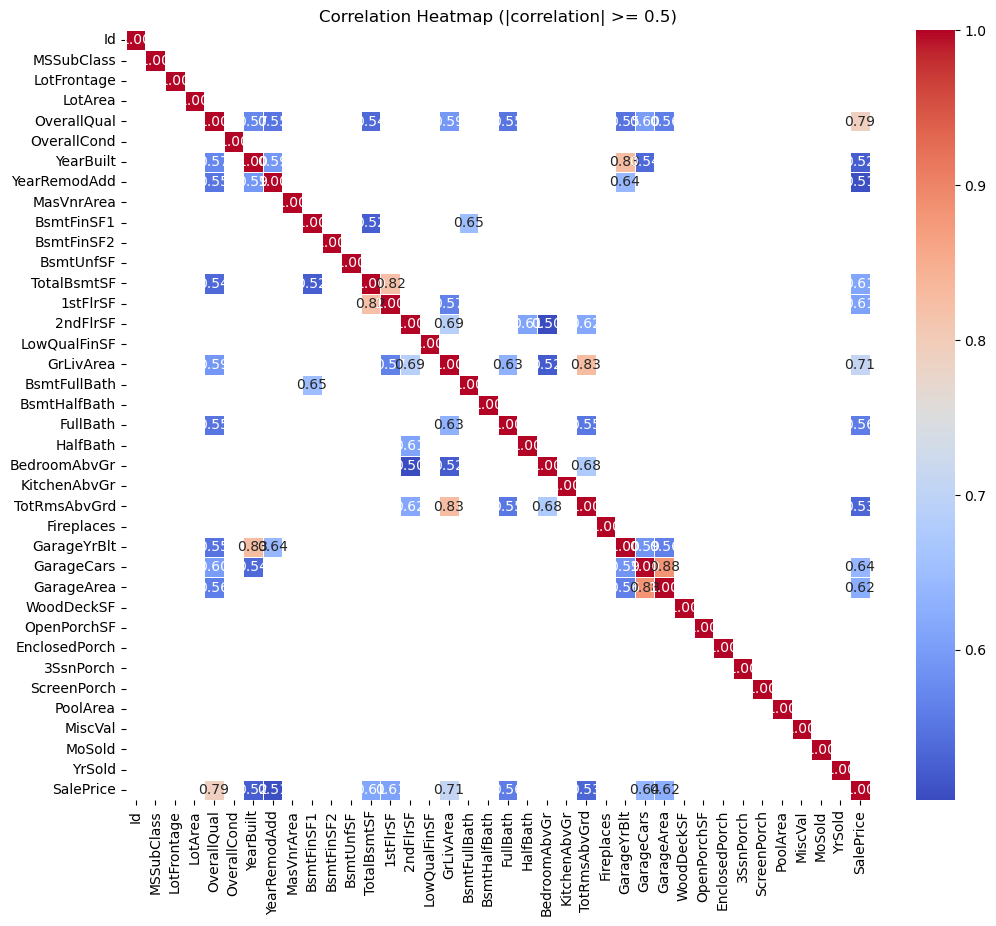

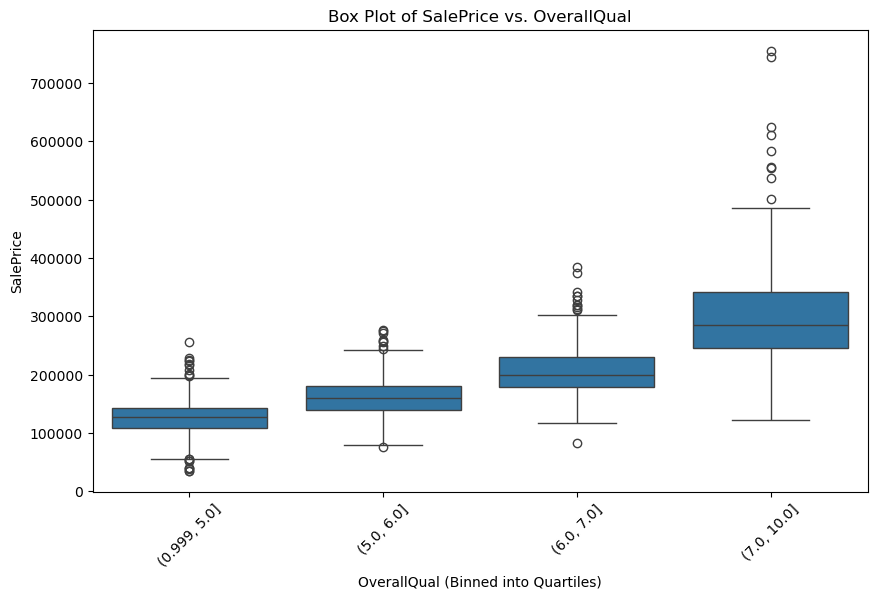

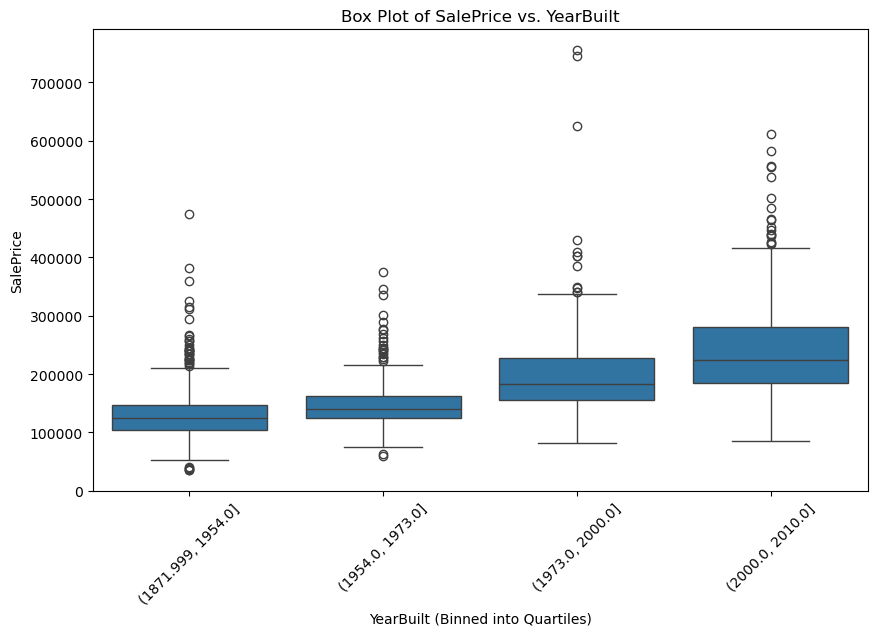

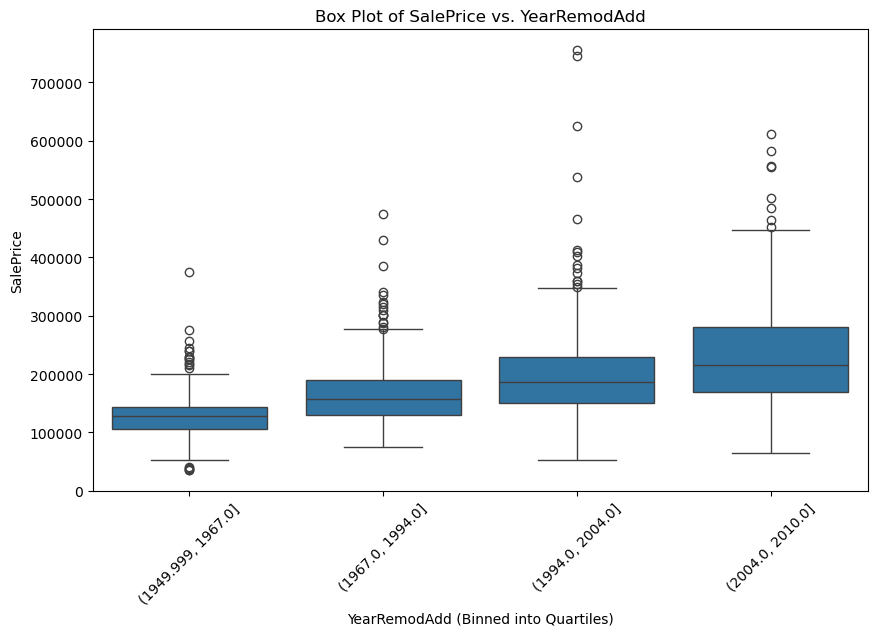

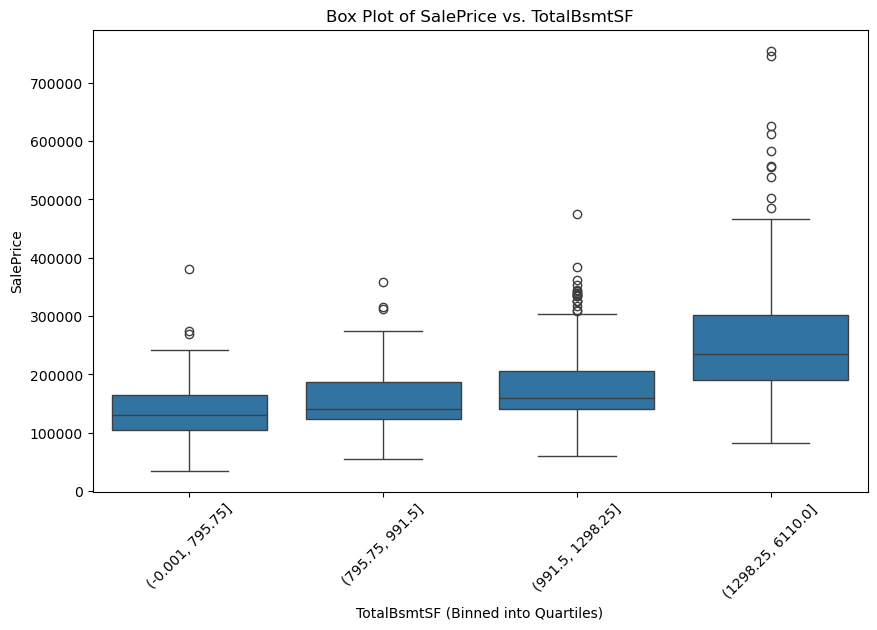

...

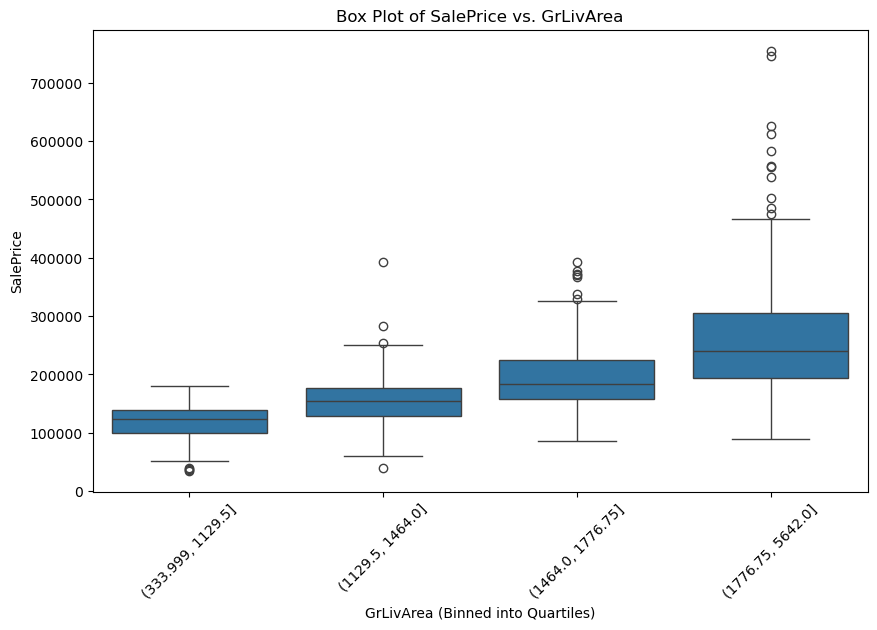

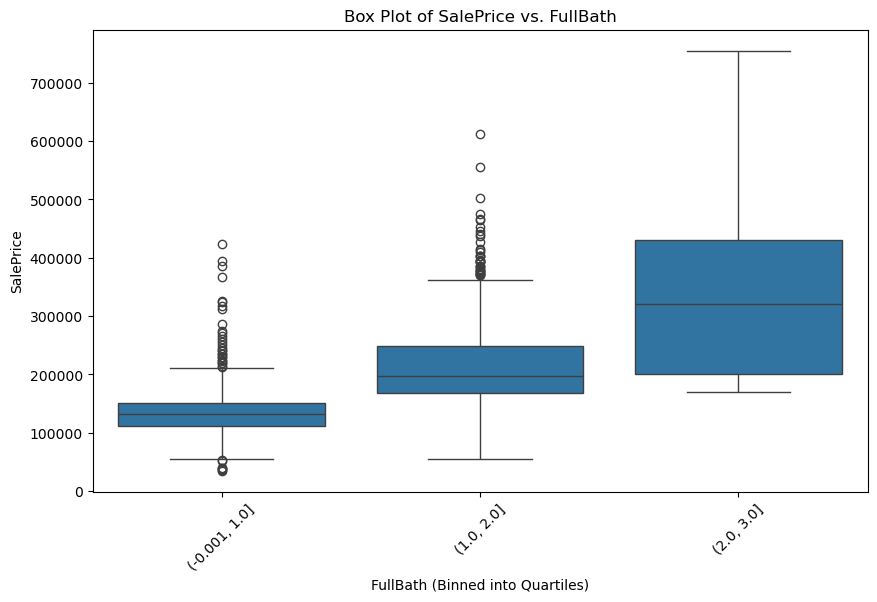

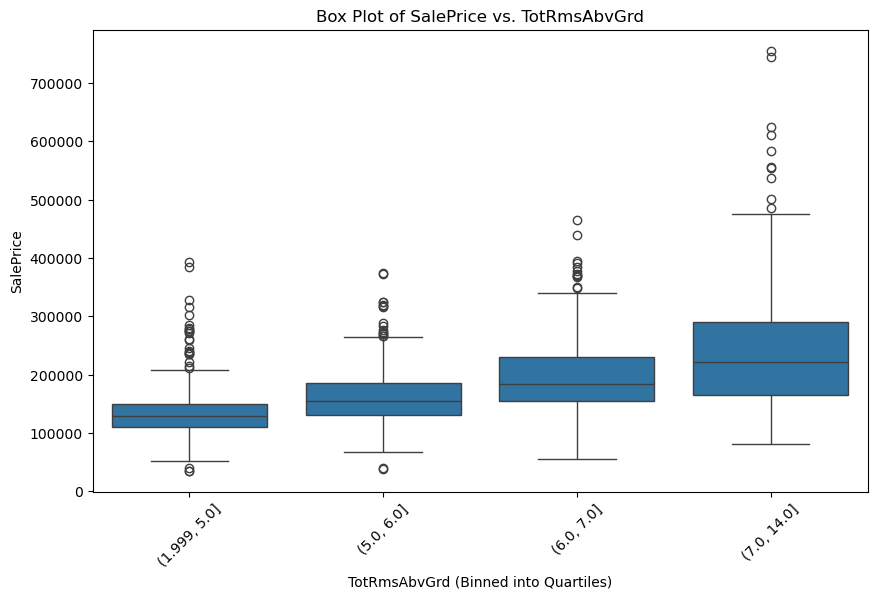

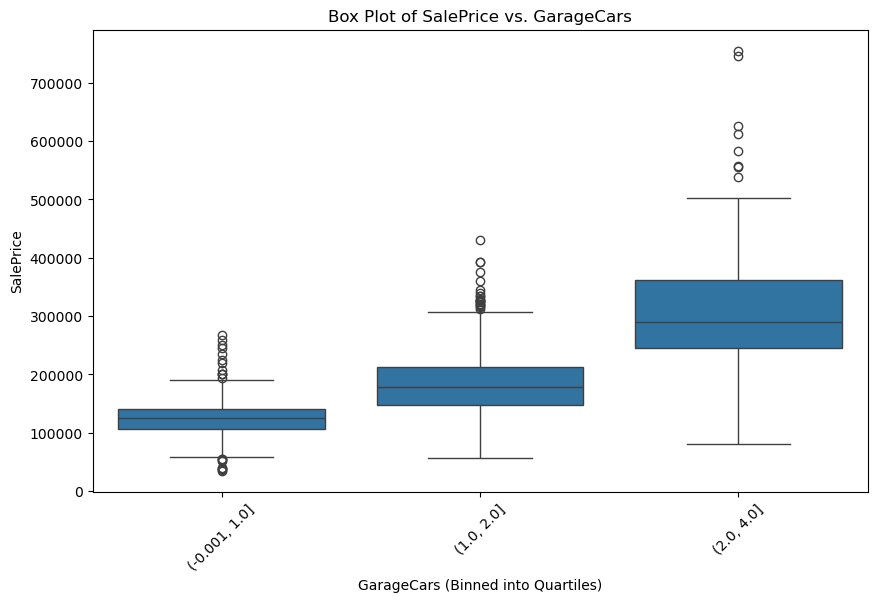

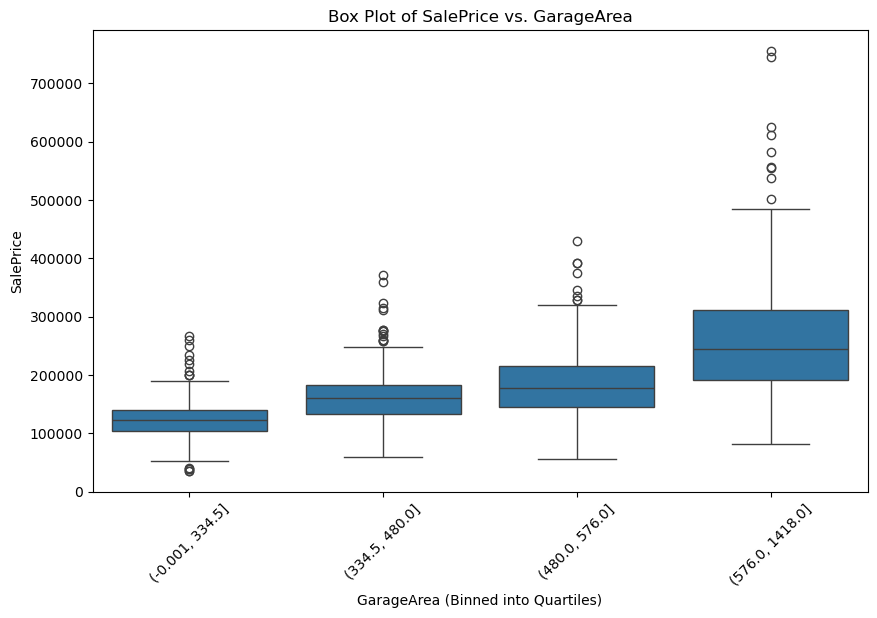

In [48]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Sample DataFrame (replace 'df' with your actual DataFrame)
# df = pd.read_csv("your_data.csv")

# Step 1: Drop rows with missing values in any column
df_cleaned = df.dropna(subset=['SalePrice'])  # Keep rows with SalePrice

# Step 2: Drop non-numeric columns for correlation calculation
numeric_df = df_cleaned.select_dtypes(include=['number'])  # Only numeric data

# Step 3: Correlation Matrix
correlation_matrix = numeric_df.corr()

# Step 4: Filter correlations with absolute value >= 0.5 and remove those below
filtered_corr = correlation_matrix[correlation_matrix.abs() >= 0.5]

# Step 5: Heatmap for filtered correlations
plt.figure(figsize=(12, 10))
sns.heatmap(filtered_corr, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5, mask=filtered_corr.isnull())
plt.title("Correlation Heatmap (|correlation| >= 0.5)")
plt.show()

# Step 6: Check if 'SalePrice' is present in the correlation matrix before proceeding
if 'SalePrice' in filtered_corr.columns:
    important_features = filtered_corr.index[filtered_corr['SalePrice'].abs() >= 0.5].tolist()
    
    # Ensure features exist in numeric_df
    selected_features = [feature for feature in important_features if feature in numeric_df.columns]

    # Step 7: Box Plots for each important feature against SalePrice
    for feature in selected_features:
        if feature != 'SalePrice':  # No need to plot SalePrice against itself
            plt.figure(figsize=(10, 6))
            sns.boxplot(x=pd.qcut(numeric_df[feature], q=4, duplicates='drop'), y=numeric_df['SalePrice'])
            plt.title(f"Box Plot of SalePrice vs. {feature}")
            plt.xlabel(f"{feature} (Binned into Quartiles)")
            plt.ylabel("SalePrice")
            plt.xticks(rotation=45)
            plt.show()
else:
    print("SalePrice column not found in the filtered correlation matrix.")



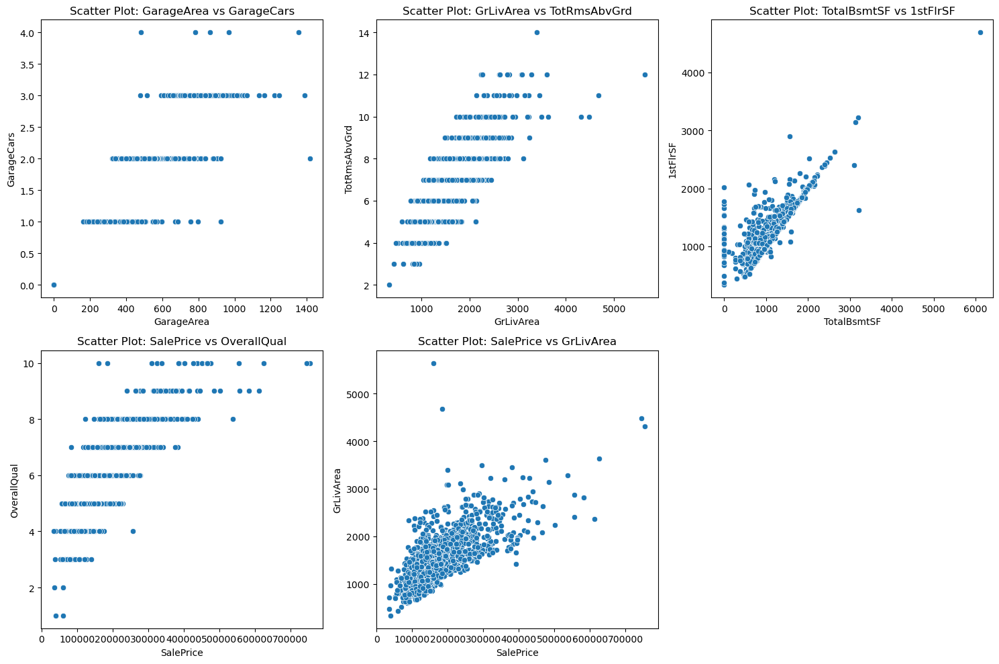

In [31]:
import matplotlib.pyplot as plt
import seaborn as sns

# Get the top 5 highest correlations
top_5_correlations = important_correlations.unstack().sort_values(ascending=False).drop_duplicates()
top_5_correlations = top_5_correlations[top_5_correlations != 1.0].head(5)

# Plot scatter plots for the top 5 correlations
plt.figure(figsize=(15, 10))

for i, (var1, var2) in enumerate(top_5_correlations.index):
    plt.subplot(2, 3, i + 1)
    sns.scatterplot(data=numeric_df, x=var1, y=var2)
    plt.title(f'Scatter Plot: {var1} vs {var2}')
    plt.xlabel(var1)
    plt.ylabel(var2)

plt.tight_layout()
plt.show()



In [35]:
# Handle categorical columns: Perform one-hot encoding
df_encoded = pd.get_dummies(df_cleaned, drop_first=True)  # drop_first=True to avoid dummy variable trap

# Calculate correlation matrix
correlation_matrix = df_encoded.corr()

# Calculate correlation of each feature with the target variable 'SalePrice'
correlation_with_target = correlation_matrix['SalePrice'].sort_values(ascending=False)

# Select the top 5 features with the highest correlation (excluding 'SalePrice' itself)
top_5_features = correlation_with_target.index[1:6]

# Select the feature matrix X and target variable y
X = df_encoded[top_5_features]  # Features (independent variables)
y = df_cleaned['SalePrice']  # Target variable (dependent variable)

# Display the selected top 5 features and the first few rows of X and y
print("Top 5 Features with Highest Correlation to SalePrice:")
print(top_5_features)
print("\nFeature Matrix (X):")
print(X.head())
print("\nTarget Variable (y):")
print(y.head())


Top 5 Features with Highest Correlation to SalePrice:
Index(['OverallQual', 'GrLivArea', 'GarageCars', 'GarageArea', 'TotalBsmtSF'], dtype='object')

Feature Matrix (X):
   OverallQual  GrLivArea  GarageCars  GarageArea  TotalBsmtSF
0            7       1710           2         548          856
1            6       1262           2         460         1262
2            7       1786           2         608          920
3            7       1717           3         642          756
4            8       2198           3         836         1145

Target Variable (y):
0    208500
1    181500
2    223500
3    140000
4    250000
Name: SalePrice, dtype: int64


Top 5 Features with Highest Correlation to SalePrice:
OverallQual: This feature represents the overall quality of the house (probably on a scale like 1-10 or similar). It is often one of the most important features for house prices. A higher quality generally leads to a higher price.

GrLivArea: This is the above-ground living area in square feet. Larger houses tend to sell for higher prices. Hence, this feature is highly correlated with SalePrice.

GarageCars: The number of cars that can fit in the garage. More garage spaces typically imply a larger house, contributing to higher house prices.

GarageArea: The total area of the garage in square feet. A larger garage area is usually associated with a higher-quality home, and thus, a higher sale price.

TotalBsmtSF: The total area of the basement in square feet. A larger basement is an indicator of more usable space, which contributes to the overall value of the house.

Feature Matrix (X):
This is the matrix of features (independent variables) used to predict the target variable SalePrice. Each row represents a house, and the columns represent the values for each feature.

For example:

Row 0: The first house has an OverallQual of 7, GrLivArea of 1710 sq. ft., GarageCars of 2, GarageArea of 548 sq. ft., and TotalBsmtSF of 856 sq. ft.
Row 1: The second house has an OverallQual of 6, GrLivArea of 1262 sq. ft., GarageCars of 2, GarageArea of 460 sq. ft., and TotalBsmtSF of 1262 sq. ft.
Target Variable (y):
This is the sale price (SalePrice) of the house. The values are the prices for each corresponding house in the feature matrix.

For example:

Row 0: The sale price is 208,500.
Row 1: The sale price is 181,500.
Row 2: The sale price is 223,500.
What This Tells You:
Predictive Power of Features: The top 5 features you’ve selected (OverallQual, GrLivArea, GarageCars, GarageArea, TotalBsmtSF) are highly correlated with the SalePrice, meaning they have significant predictive power. You can expect these features to play a big role in determining the house price in a regression model.

High Correlation: These features have a strong relationship with the sale price, so they are good candidates to include in a model predicting house prices. A good practice would be to focus on these features when trying to explain the variance in the target variable.

Data Preparation: The data for the top 5 features and the target variable looks reasonable and continuous, so you can use these variables directly in a machine learning model without much preprocessing.

In summary, these are the most important features for predicting the house price in your dataset, and they should help the model understand the factors influencing the price. The next step would be to use this feature matrix to train a model (like linear regression) and evaluate its performance.

In [38]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Display the shapes of the resulting datasets
print(f"Training features (X_train) shape: {X_train.shape}")
print(f"Testing features (X_test) shape: {X_test.shape}")
print(f"Training target (y_train) shape: {y_train.shape}")
print(f"Testing target (y_test) shape: {y_test.shape}")


Training features (X_train) shape: (1168, 5)
Testing features (X_test) shape: (292, 5)
Training target (y_train) shape: (1168,)
Testing target (y_test) shape: (292,)


In [39]:
# Initialize the scaler
scaler = StandardScaler()

# Fit the scaler on the training data and transform it
X_train_scaled = scaler.fit_transform(X_train)

# Transform the test data using the already-fitted scaler
X_test_scaled = scaler.transform(X_test)



In [41]:
from sklearn.linear_model import LinearRegression


# Initialize the linear regression model
model = LinearRegression()

# Fit the model on the scaled training data
model.fit(X_train_scaled, y_train)

# Make predictions on the scaled test data
y_pred = model.predict(X_test_scaled)

# Display the model's coefficients and intercept
print(f"Model coefficients: {model.coef_}")
print(f"Model intercept: {model.intercept_}")

Model coefficients: [32584.16580199 22242.0295901  11773.89480638  3293.01103361
 12113.61934   ]
Model intercept: 181441.5419520548


In [42]:
from sklearn.metrics import mean_squared_error, r2_score

# Calculate and print the Mean Squared Error (MSE)
mse = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error (MSE): {mse}")

# Calculate and print the R-squared value
r2 = r2_score(y_test, y_pred)
print(f"R-squared (R²): {r2}")

Mean Squared Error (MSE): 1598354833.0864913
R-squared (R²): 0.79161840188898


Yes, an R-squared (R²) value of 0.7916 is generally considered a good measure for a regression model, especially for real-world data. Here's why:

R² Interpretation:
0.79 (or 79%) means your model explains 79% of the variance in the target variable (SalePrice), which is a solid result for most practical cases.
In domains like real estate, where many factors influence house prices (e.g., location, market conditions, etc.), an R² value of around 0.8 indicates that your model does a good job of capturing the relationship between the features and the target.
Is it "Good"?
Yes, in most cases, an R² value above 0.7 is considered very good. For regression models, achieving higher than 0.8 (or even 0.9) is ideal, but anything above 0.7 generally means the model is capturing the important patterns in the data.
However, whether 0.79 is enough depends on your use case:
If you're building a model for a real-time application (e.g., price prediction for buyers/sellers), you might want to aim for even better performance.
If you're working on exploratory analysis or a first model, 0.79 is excellent and a great starting point.
What About MSE?
The Mean Squared Error (MSE) value of 1,598,354,833.09 tells you the average squared error between the predicted and actual values. While MSE can be useful for model diagnostics, its interpretation is tricky without context (like the range of house prices). A lower MSE is better, but it’s most useful when compared to other models or baselines.

Conclusion:
R² of 0.79 indicates your model is doing well in terms of explaining variability in house prices.
If you’re happy with the predictive accuracy, then this is a good model.
If you're aiming for perfect predictions, there's still some room for improvement (e.g., refining the model, adding more features, or adjusting parameters).
In short, yes, it’s a good measure and shows that your model is performing decently, but there’s always room for optimization based on your goals.

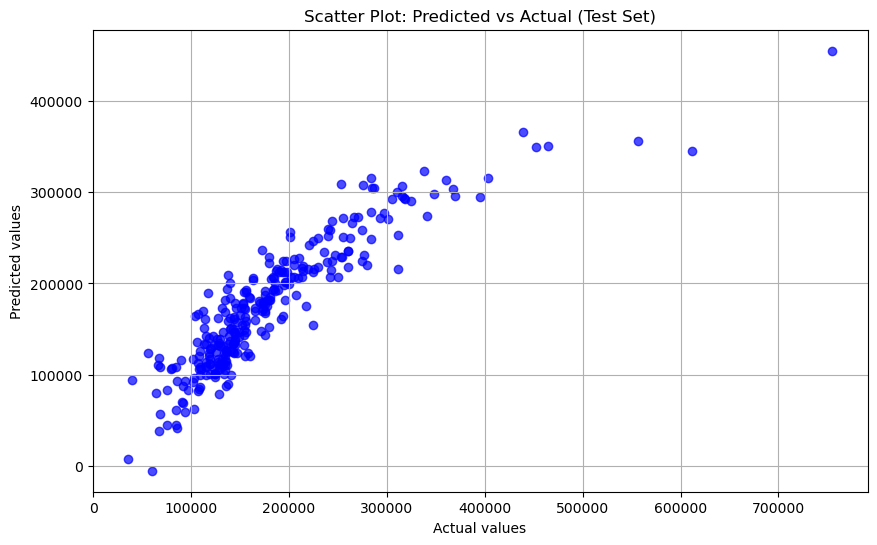

In [43]:
import matplotlib.pyplot as plt

# Scatter plot: Predicted vs Actual values for Test Set
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, color='blue', alpha=0.7)
plt.title("Scatter Plot: Predicted vs Actual (Test Set)")
plt.xlabel("Actual values")
plt.ylabel("Predicted values")
plt.grid(True)
plt.show()


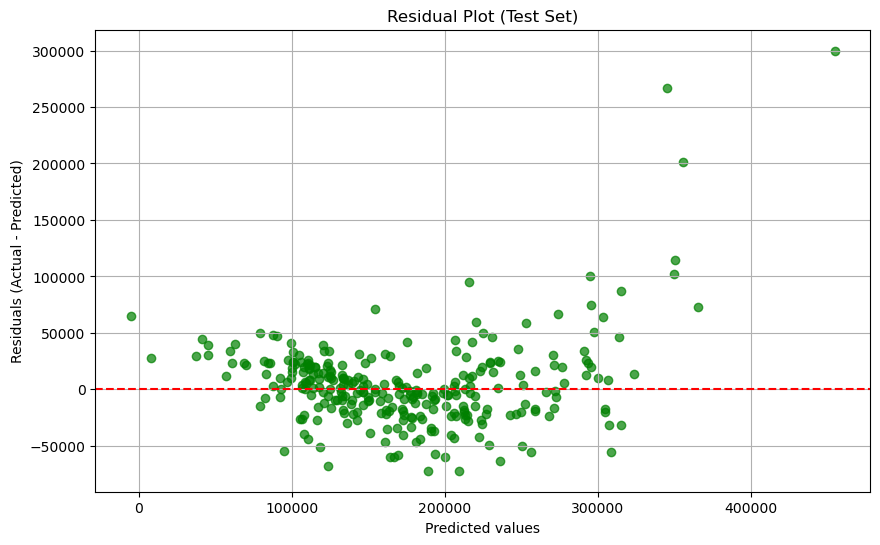

In [44]:
# Residual plot for Test Set
residuals_test = y_test - y_pred

plt.figure(figsize=(10, 6))
plt.scatter(y_pred, residuals_test, color='green', alpha=0.7)
plt.title("Residual Plot (Test Set)")
plt.xlabel("Predicted values")
plt.ylabel("Residuals (Actual - Predicted)")
plt.axhline(0, color='red', linestyle='--')
plt.grid(True)
plt.show()


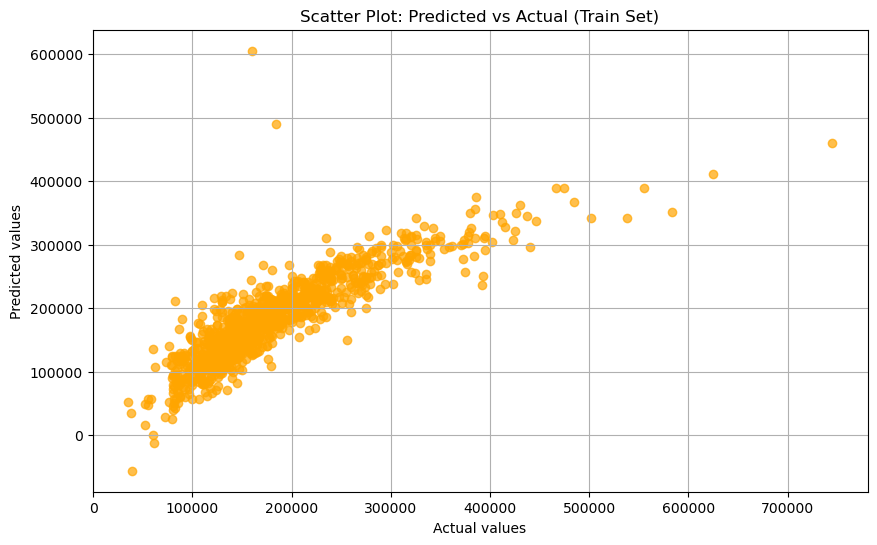

In [45]:
# Make predictions on the training set
y_train_pred = model.predict(X_train_scaled)

# Scatter plot: Predicted vs Actual values for Train Set
plt.figure(figsize=(10, 6))
plt.scatter(y_train, y_train_pred, color='orange', alpha=0.7)
plt.title("Scatter Plot: Predicted vs Actual (Train Set)")
plt.xlabel("Actual values")
plt.ylabel("Predicted values")
plt.grid(True)
plt.show()

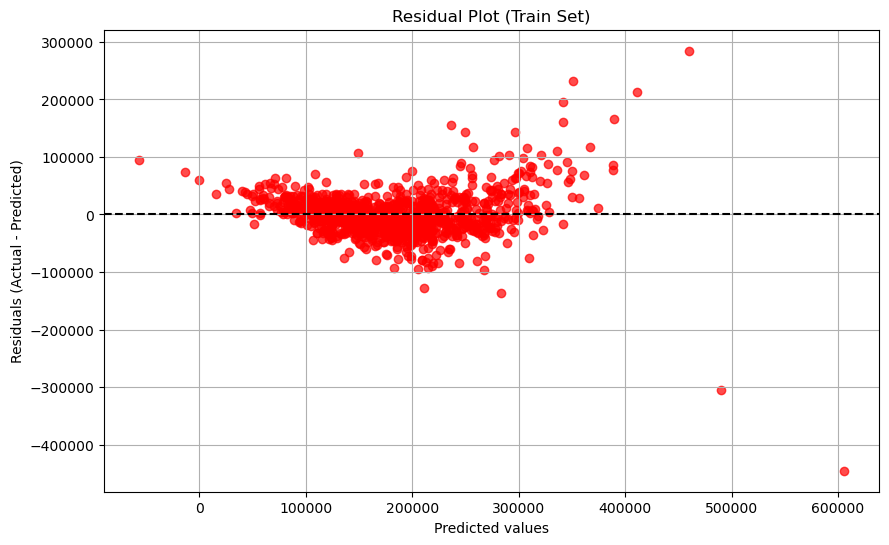

In [46]:
# Residual plot for Train Set
residuals_train = y_train - y_train_pred

plt.figure(figsize=(10, 6))
plt.scatter(y_train_pred, residuals_train, color='red', alpha=0.7)
plt.title("Residual Plot (Train Set)")
plt.xlabel("Predicted values")
plt.ylabel("Residuals (Actual - Predicted)")
plt.axhline(0, color='black', linestyle='--')
plt.grid(True)
plt.show()

Scatter Plot (Predicted vs Actual): This plot helps in understanding how closely predictions match actual values.
Residual Plot: Shows how well the model is performing across different predicted values. Ideally, the residuals should be randomly scattered around the horizontal line (0), indicating no clear patterns in the errors.
These plots will help you visually compare the performance of your model on both the training and test data.